In [1]:
import scanpy as sc
import sys
from pathlib import Path
sc.set_figure_params(dpi=150, ipython_format='retina')
import ipywidgets as widgets
import matplotlib.pyplot as plt

In [2]:
PROJECT_ROOT = Path.cwd().parent

if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

In [3]:
# Read normalized log-transformed adata_qc
adata_qc_path = PROJECT_ROOT / "data" / "interim" / "E-MTAB-8410_qc.h5ad"
adata_qc = sc.read_h5ad(adata_qc_path)

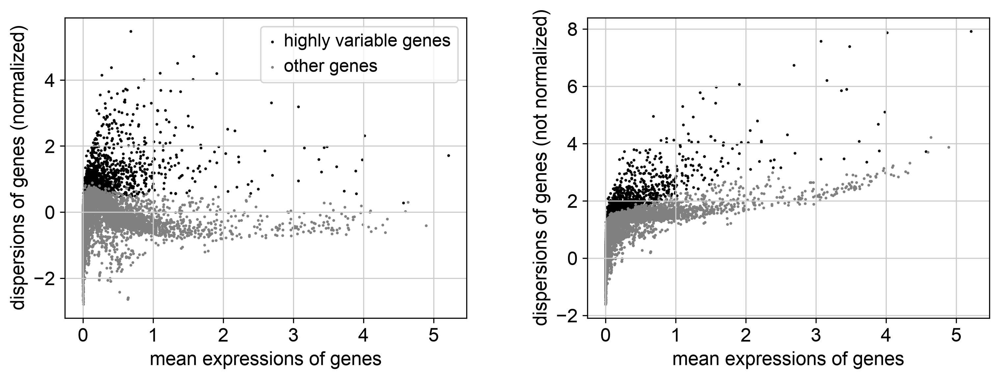

In [5]:
# Batch-aware feature selection
sc.pp.highly_variable_genes(
    adata_qc,
    flavor="seurat",
    n_top_genes=2_000,
    batch_key="biosample_id",
)

with plt.rc_context({"figure.figsize": (6, 4)}):
    sc.pl.highly_variable_genes(
        adata_qc,
        )

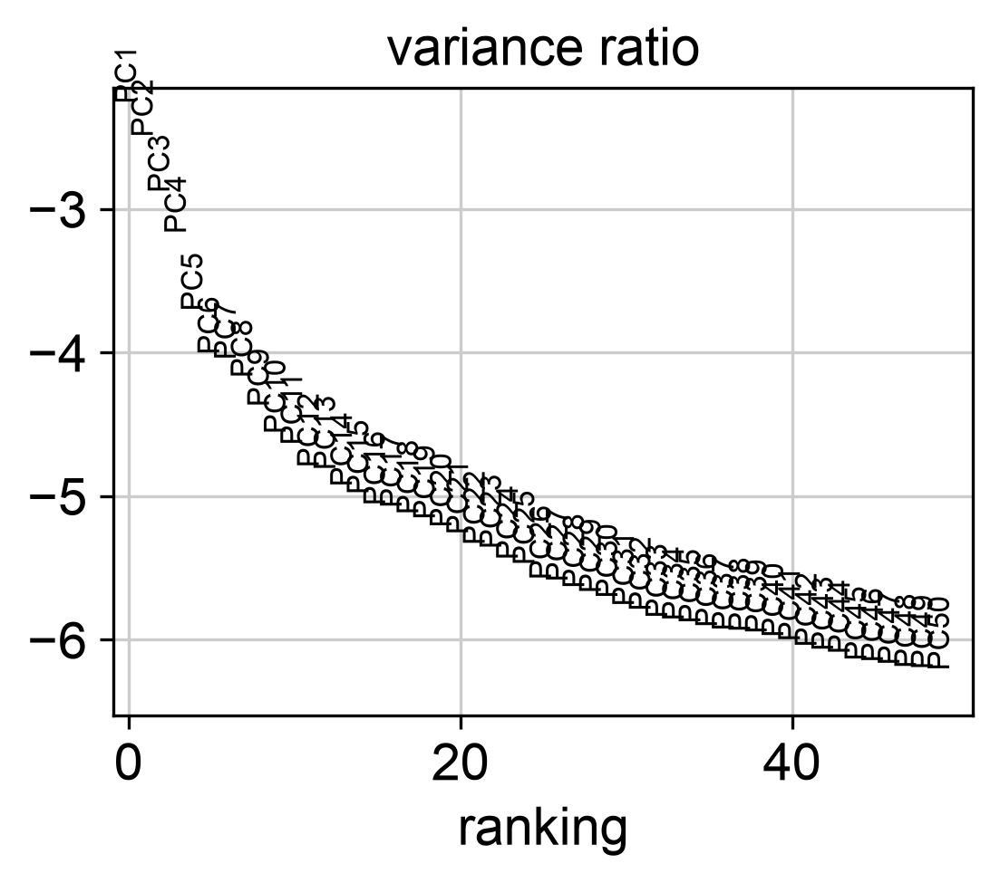

In [6]:
# PCA
sc.tl.pca(
    adata_qc
)

# Inspect how much variation each PC captures.
with plt.rc_context({"figure.figsize": (4, 3)}):
    sc.pl.pca_variance_ratio(
    adata_qc,
    n_pcs=50,
    log=True,
)

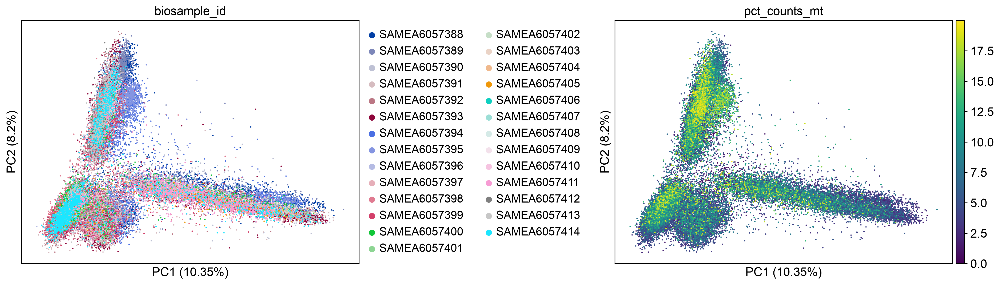

In [7]:
# Plot PCA
with plt.rc_context({"figure.figsize": (6, 5)}):
    sc.pl.pca(
    adata_qc,
    color=["biosample_id", "pct_counts_mt"],
    ncols=3,
    wspace=0.6,
    size=10,
    annotate_var_explained=True,
)

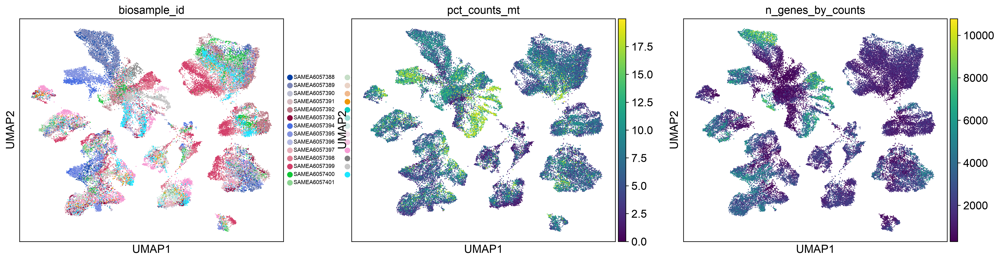

In [8]:
# Nearest neighbor graph construction
sc.pp.neighbors(
    adata_qc,
    n_pcs=30,
)

sc.tl.umap(
    adata_qc,
    random_state=0,
)

with plt.rc_context({"figure.figsize": (6, 5)}):
    sc.pl.umap(
    adata_qc,
    color=["biosample_id","pct_counts_mt","n_genes_by_counts"],
    size=5,
    legend_fontsize=7,
    )

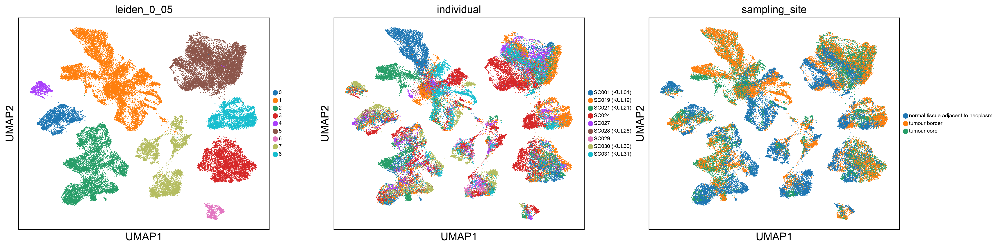

In [9]:
# Clustering
resolutions = [0.05, 0.1, 0.5]

for resolution in resolutions:
    resolution_label = str(resolution).replace(".", "_")

    sc.tl.leiden(
        adata_qc,
        resolution=resolution,
        flavor="igraph",
        key_added=f"leiden_{resolution_label}",
        random_state=0,
        n_iterations=3,
    )

with plt.rc_context({"figure.figsize": (6, 5)}):
    sc.pl.umap(
    adata_qc,
    color=["leiden_0_05","individual","sampling_site"],
    size=5,
    legend_fontsize=7,
    )

In [11]:
from src.ingest_data import write_h5ad
write_h5ad(
    adata_qc,
    output_path = PROJECT_ROOT / "data" / "interim" / "E-MTAB-8410_qc.h5ad"
)